In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np

Part-1: Loading Images/Videos and Rescaling Them

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Read the image
img = cv.imread('/content/drive/MyDrive/IMG_20210829_074650934_HDR.jpg', cv.COLOR_RGB2HSV)

#you can also put 0 or 1 after the argument above, where 0 is grayscale image and 1 is normal
#after the image filename, you can also put the colourspace conversion scheme as an argument

In OpenCV the concept of colour spaces includes colourspaces like RGB, HSV, BGR etc. A colourspace is a combination of specific colours. For example, in RGB, tuning and adjusting Red, Blue and Green at varying amounts will give us various colours within that colourspace.

This snippet shows the image -> cv2.imshow('screenshot1', img).
However imshow function causes crashes on Jupyter 
Notebook as shown on Google Colab, hence we will be using cv2_imshow

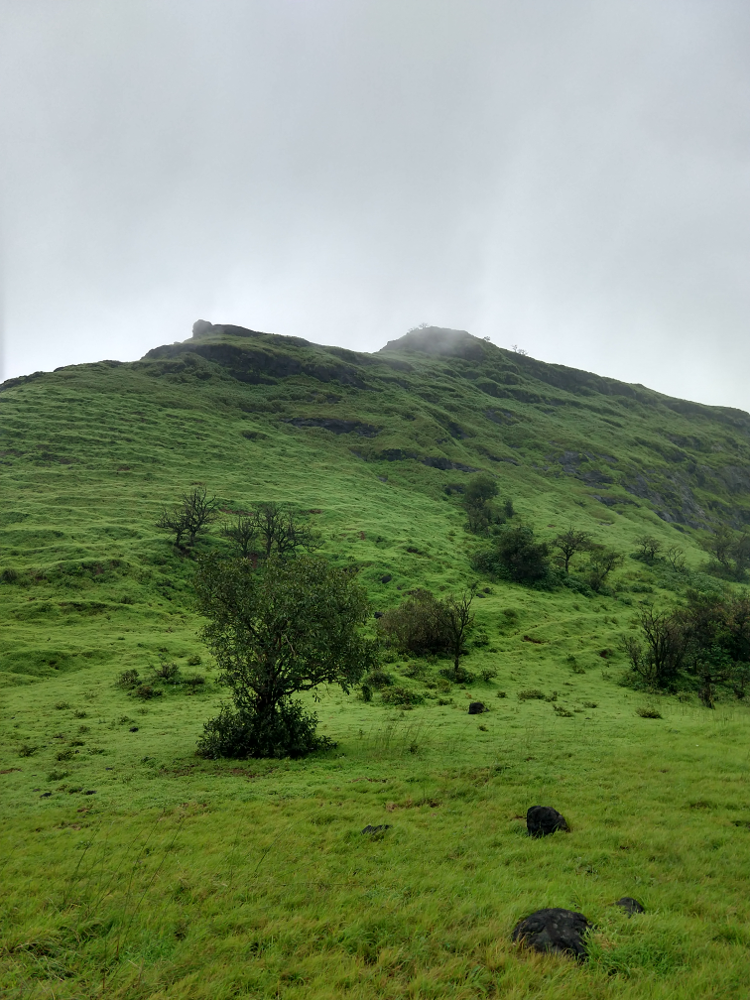

In [ ]:
cv2_imshow(img)

In [ ]:
cv.waitKey(6000)

-1

In [ ]:
capture = cv.VideoCapture('/content/drive/MyDrive/Indian Highway Aerial View No Copyright Drone Footage NCFI.mp4')

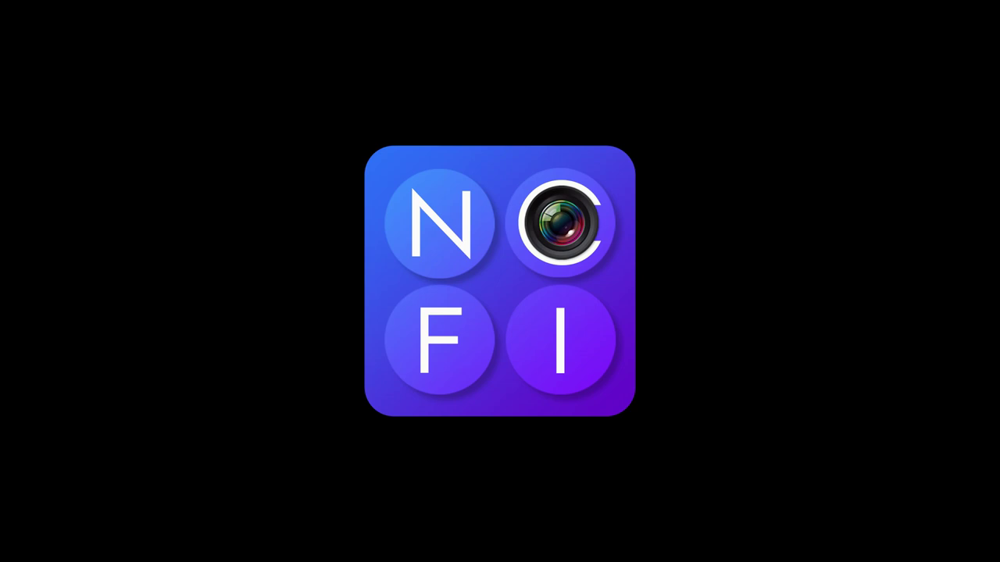

In [ ]:
while capture.isOpened():
    isTrue, frame = capture.read()

    #frame_resized = rescale_frame(frame)
    
    cv2_imshow(frame)
    #cv2_imshow(frame_resized)
    
    if cv.waitKey(20) or 0xff==ord('d'):
        break

In [ ]:
capture.release()
cv.destroyAllWindows()

In [ ]:
cv.waitKey(0)

-1

In [ ]:
def rescale_frame(frame, scale=0.75):
  width = int(frame.shape[1] * scale)
  height = int(frame.shape[0] * scale)

  dimensions = (width, height)

  return cv.resize(frame, dimensions, interpolation=cv.INTER_AREA) #other interpolations are INTER_CUBIC, INTER_LINEAR

Part-2: Drawing Shapes and Putting Frames On Images

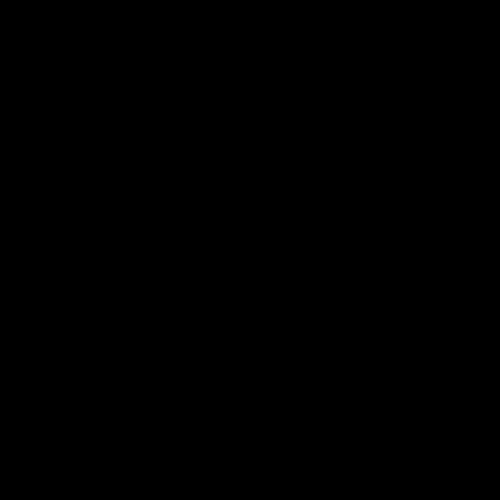

In [ ]:
# below, 500 and 500 are the width and height and 3 are no. of colour channels
blank_image = np.zeros((500, 500, 3), dtype='uint8') #created a blank image
cv2_imshow(blank_image)

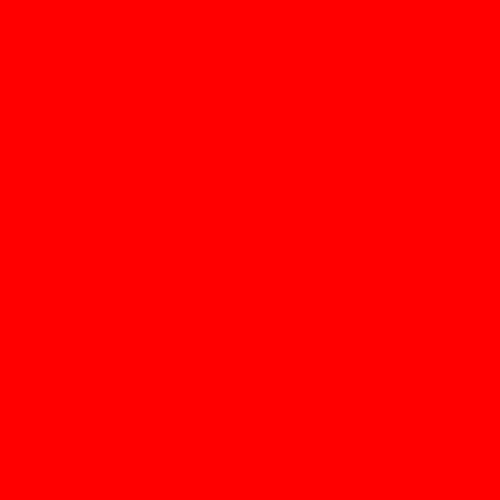

In [ ]:
#Colour certain portion of image in range of pixels

newblank = blank_image.copy()
newblank[:] = 0,0,255 #[:] is the whole picture
cv2_imshow(newblank)

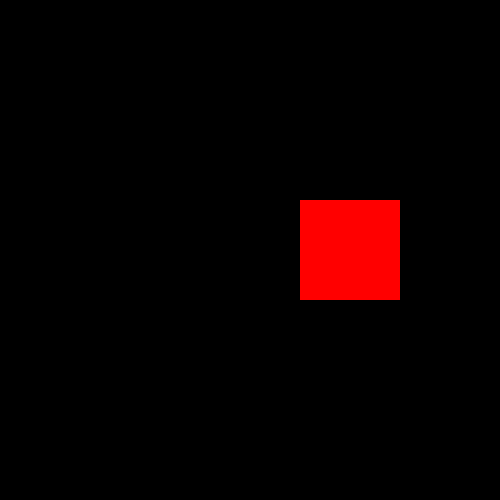

In [ ]:
newblank2 = blank_image.copy()
newblank2[200:300, 300:400] = 0,0,255#range of pixels by height and width
cv2_imshow(newblank2)

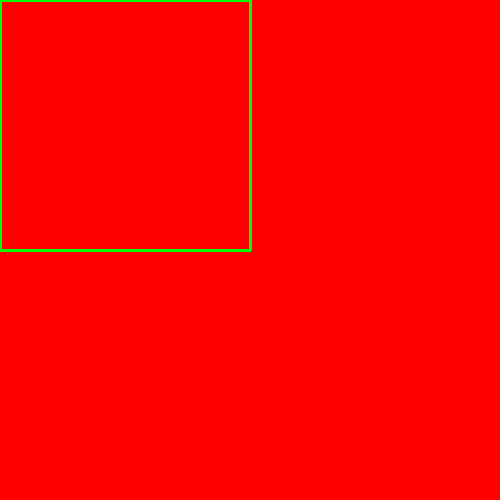

In [ ]:
# We'll now draw a rectangle
square_within = newblank.copy()
cv.rectangle(square_within, (0,0), (250,250), (0,255,0), thickness=2) #(0,0), 
cv2_imshow(square_within)

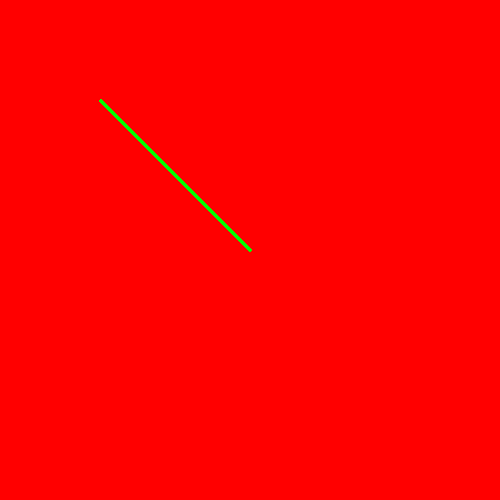

In [ ]:
# Draw a line
line_within = newblank.copy()
cv.line(line_within, (100,100), (250,250), (0,255,0), thickness=2)
cv2_imshow(line_within)

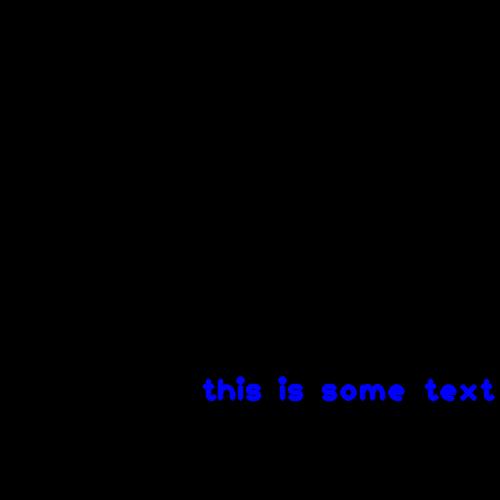

In [ ]:
picwithtext = blank_image.copy()
text = "this is some text"
fontFace = cv.FONT_HERSHEY_PLAIN
fontScale = 2
fontColour = 255
fontThickness = 3
cv.putText(picwithtext, text, (200,400), fontFace, fontScale, fontColour, fontThickness, cv.LINE_AA)
cv2_imshow(picwithtext)

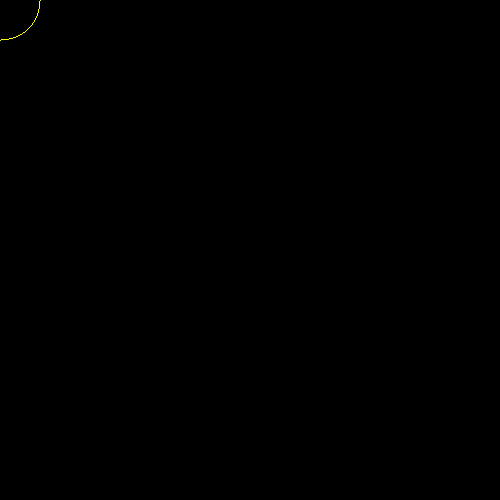

In [ ]:
# Draw a circle
circlein = blank_image.copy()
cv.circle(circlein, (0,0), 40, (0,255,255))
cv2_imshow(circlein)

PART-3: BASIC OPERATIONS WITH IMAGE OBJECT

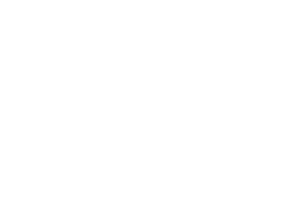

180000
uint8
(200, 300, 3)
255
255


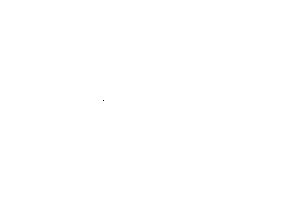

In [ ]:
white_image = 255 * np.ones([200, 300, 3], dtype=np.uint8 )
cv2_imshow(white_image)

#Image attributes accessed
print(white_image.size)
print(white_image.dtype)
print(white_image.shape)

#Accessing pixel values by either R, G or B denoted by 0,1 and 2 respectively

colour = white_image[100,100, 1]
print(colour)

colour2 = white_image.item(10, 10, 2)
print(colour2)

#Changing img pixel value

white_image.itemset((100,200,2), 255)

white_image[100, 103] = [0,2,1]

#Operations with images with functions

b,g,r = cv.split(white_image)

cv.merge(b,g,r)

PART-4: IMAGE BLURRING AND SHARPENING WITH SMOOTHING FILTERS

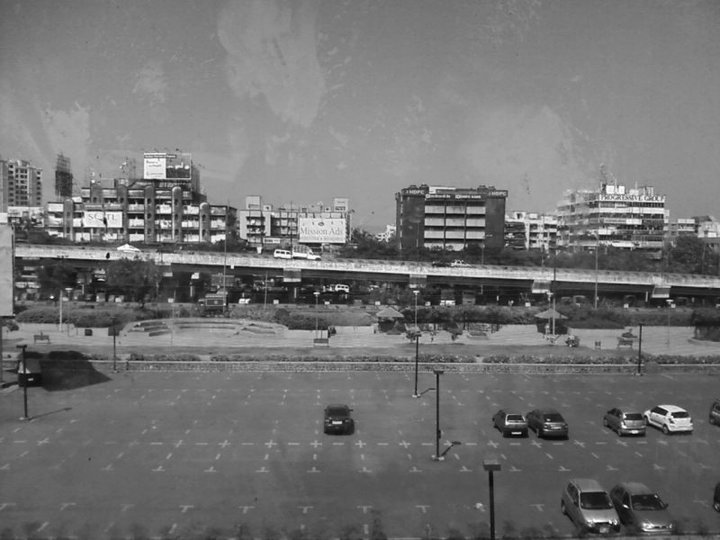

-1

In [ ]:
#Grayscaling an image
#cvtColor is a colourspace transformation function

img = cv.imread('/content/drive/MyDrive/206239_166157343440600_2214699_n.jpg')

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(gray)
cv.waitKey(0)

The colors present in a given image is represented by color spaces in OpenCV and there are several color spaces each having its own importance and some of the color spaces are RGB, CMYK, etc. and whenever there is a need to convert a given image from one color space to another color space in OpenCV, then we make use of a function called cvtColor() function and there are more than 150 color space conversions codes available in OpenCV, some of them are cv2.COLOR_BGR2GRAY, cv2.COLOR_BGR2HSV etc.

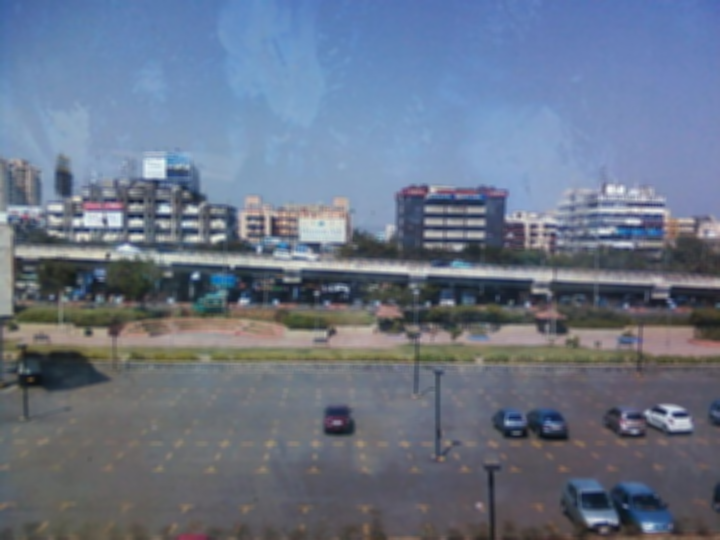

In [ ]:
# filter2D() function is used to apply a kernel to an image and carry out convolution

# a. kernel1 is an Identity Kernel

# Multiplying an Identity Kernel with any other matrix will return the original matrix, which means, essentially the same image as is.

# ddepth is desired depth of the final image and here it is -1 if depth is same as original or source image.

kernel1 = np.array([[0, 0, 0], [0, 1, 0], [0, 0, 0]])
convoluted1 = cv.filter2D(src=img, ddepth=-1, kernel=kernel1)

# b. Now we will create a custom kernel and use the filter2D() function to convolute with the pixels of the image.

# We also divide the kernel matrix with 25 to ensure that all values are 'normalized'.
# Therefore, divide the kernel with the number of elements in it. In this case, 25.

kernel2 = np.ones((5, 5), np.float32) / 25
convoluted2 = cv.filter2D(src=img, ddepth=-1, kernel=kernel2)

cv2_imshow(convoluted2)

cv.waitKey()
cv.imwrite('identity.jpg', convoluted2)
cv.destroyAllWindows()

How kernel-based convolution works


1.   Assume that the center of the kernel is positioned over a specific pixel (p), in an image.

2.   Then multiply the value of each element in the kernel (1 in this case), with the corresponding pixel element (i.e. its pixel intensity) in the source image.

3. Now, sum the result of those multiplications and compute the average.

4. Finally, replace the value of pixel (p), with the average value you just computed.




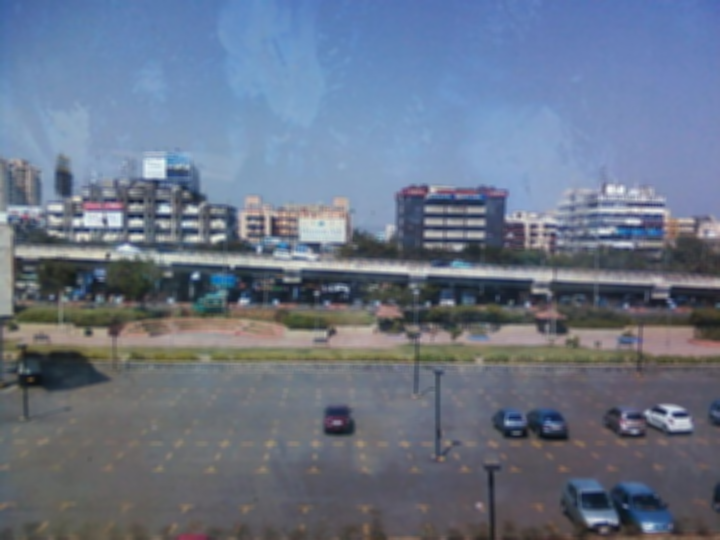

In [ ]:
blur = cv.blur(src = img, ksize=(5,5))
cv2_imshow(blur)

cv.waitKey()
cv.destroyAllWindows()

cv.blur() function is the most basic blurring fuction and is also called as a function of convenience. Here, you don't need to define the kernel; you only have to mention the kernel size.

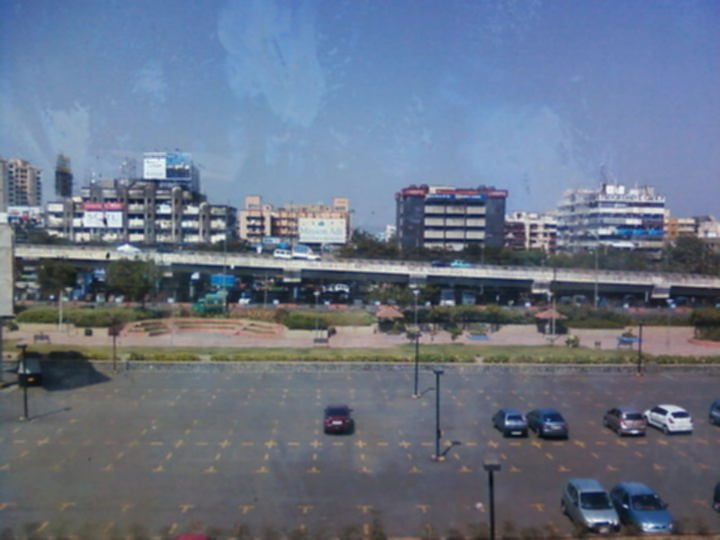

In [ ]:
Gblur = cv.GaussianBlur(img, (3,3), sigmax=0, sigmay=0, cv.BORDER_DEFAULT)
cv2_imshow(Gblur)
#(3,3) is kernel size. More the kernel size, more the blur

cv.waitKey()
cv.destroyAllWindows()

The above technique uses a Gaussian filter, which performs a weighted average, as opposed to the uniform average described in the first example. In this case, the Gaussian blur weights pixel values, based on their distance from the center of the kernel. Pixels further from the center have less influence on the weighted average.

To know more in detail, refer here:

https://datacarpentry.org/image-processing/06-blurring/#:~:text=In%20a%20Gaussian%20blur%2C%20the,pixel%20in%20the%20filtered%20image.

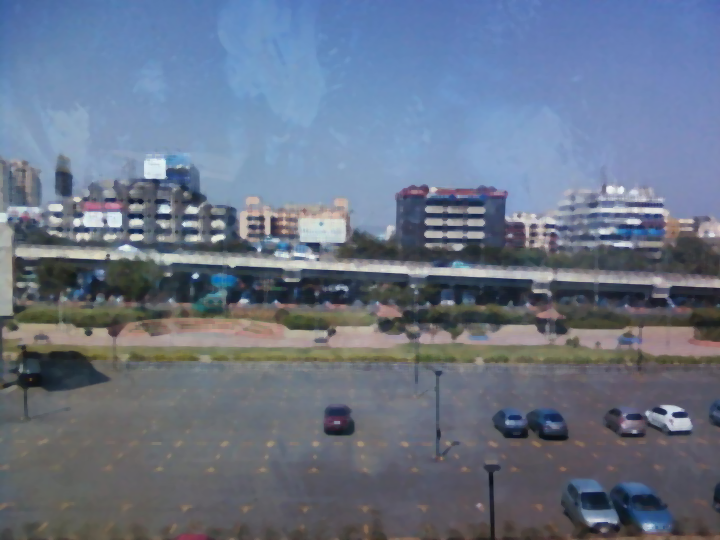

In [ ]:
# medianBlur(src, ksize)

median = cv.medianBlur(src=img, ksize=5)

cv2_imshow(median)

cv.waitKey()
cv.destroyAllWindows()

According to this source: https://stackoverflow.com/questions/61183379/how-does-opencv-medianblur-actually-work#:~:text=medianBlur()%20computes%20the%20median,salt%2Dand%2Dpepper%20noise.

medianBlur() computes the median of all the pixels under the kernel window and the central pixel is replaced with this median value. This is highly effective in removing salt-and-pepper noise.

One interesting thing to note is that, in the Gaussian and box filters, the filtered value for the central element can be a value which may not exist in the original image. However this is not the case in median filtering, since the central element is always replaced by some pixel value in the image. This reduces the noise effectively. The kernel size must be a positive odd integer.

Also, the effect of Median Blurring is more prominent than Gaussian Blurring.

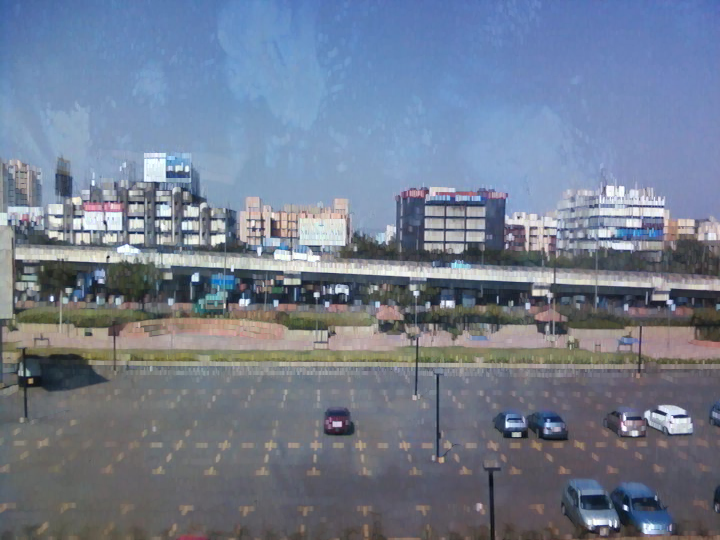

In [ ]:
#Dilating an Image Using Specific Structuring Element

dilated = cv.dilate(img, (3,3), iterations=3)
cv2_imshow(dilated) 

cv.waitKey()
cv.destroyAllWindows()

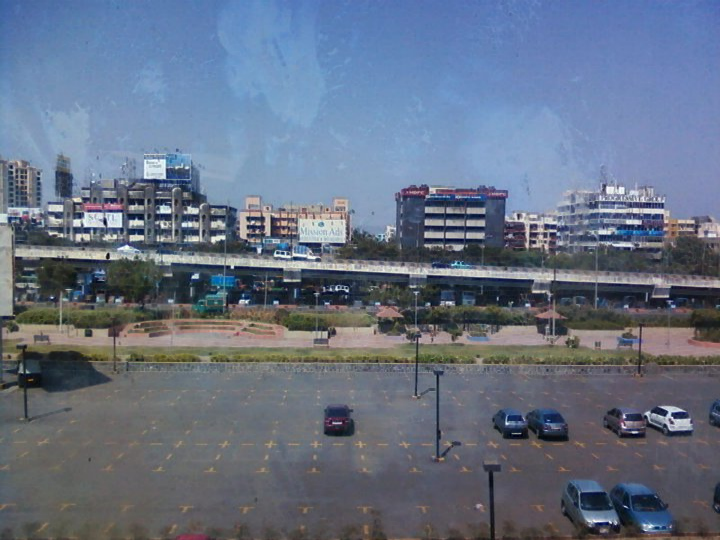

In [ ]:
#Eroding
eroded = cv.erode(img, (3,3))
cv2_imshow(eroded)

cv.waitKey()
cv.destroyAllWindows()

https://docs.opencv.org/3.4/db/df6/tutorial_erosion_dilatation.html

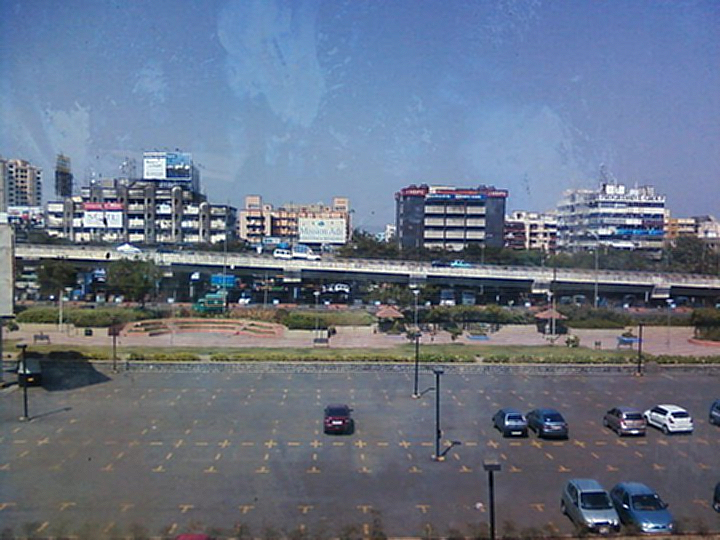

In [ ]:
# Sharpening images using 2D Convolution function

kernel3 = np.array([[0, -1,  0],[-1,  5, -1], [0, -1,  0]])
sharp_img = cv.filter2D(src=Gblur, ddepth=-1, kernel=kernel3)

cv2_imshow(sharp_img)

cv.waitKey()
cv.destroyAllWindows()

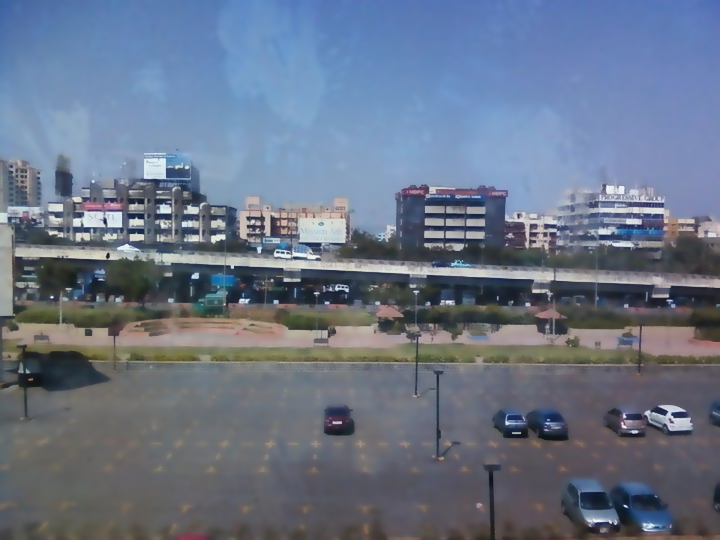

<function destroyAllWindows>

In [ ]:
# bilateralFilter(src, d, sigmaColor, sigmaSpace)

# Argument d, defines the diameter of the pixel neighborhood used for filtering.
# sigmaColor and sigmaSpace define the standard deviation of the (1D) color-intensity distribution and (2D) spatial distribution respectively.
# The sigmaSpace parameter defines the spatial extent of the kernel, in both the x and y directions (just like the Gaussian blur filter previously described).
# The sigmaColor parameter defines the one-dimensional Gaussian distribution, which specifies the degree to which differences in pixel intensity can be tolerated.

bilateral_filter = cv.bilateralFilter(src=img, d=9, sigmaColor=75, sigmaSpace=75)
cv2_imshow(bilateral_filter)

cv.waitKey()
cv.destroyAllWindows

Bilateral filtering is a method of preserving sharp edges in the face of blurring of an image. 

 

1. This technique applies the filter selectively to blur similar
intensity pixels in a neighborhood. Sharp edges are preserved, wherever possible.

2. It lets you control not only the spatial size of the filter, but also the degree to which the neighboring pixels are included in the filtered output.

3. This is done, based on variation in their color intensity, and also distance from the filtered pixel.

Bilateral filtering essentially applies a 2D Gaussian (weighted) blur to the image, while also considering the variation in intensities of neighboring pixels to minimize the blurring near edges (which we wish to preserve). What this means is that the shape of the kernel actually depends on the local image content, at every pixel location.

Complete source for all blurring and sharpening functions above: https://learnopencv.com/image-filtering-using-convolution-in-opencv/#median-blur-opencv

PART-5: IMAGE TRANSFORMATIONS

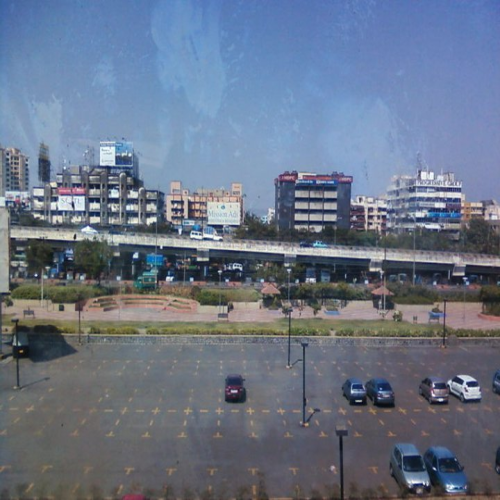

In [ ]:
# Resize and Crop an Image

  # Resizing Image

resized = cv.resize(img, (500,500), interpolation=cv.INTER_AREA)
cv2_imshow(resized)

#cv.INTER_AREA is useful when we are shrinking the image
#cv.INTER_LINEAR and cv.INTER_CUBIC for enlarging them

In [ ]:
#Crop an image

cropped = img[50:200, 200:400]
cv2_imshow(cropped)

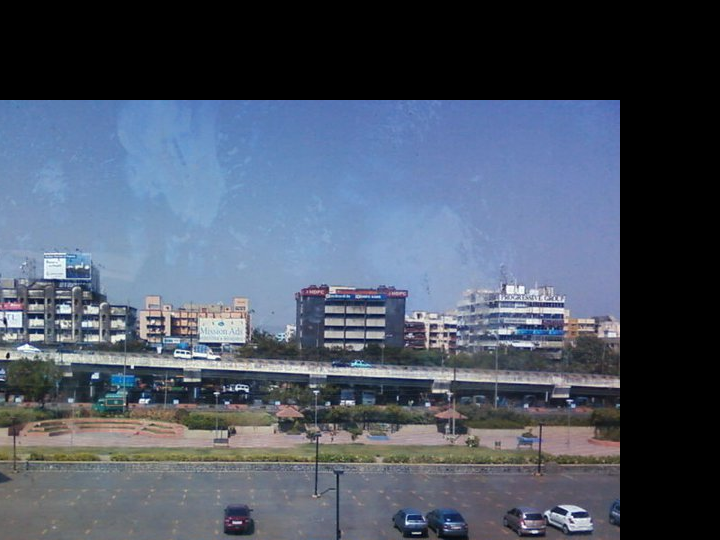

In [ ]:
# Image Translations

#along x and y axes
def translate(img, x, y):
  transMat = np.float32([[1,0,x], [0,1,y]]) #defining the image matrix. Image matrix converted into float32 data
  dimensions = (img.shape[1], img.shape[0]) #dimensions here is a tuple, consisting of height and width
  return cv.warpAffine(img, transMat, dimensions) 

translated = translate(img, -100, 100)
cv2_imshow(translated)      



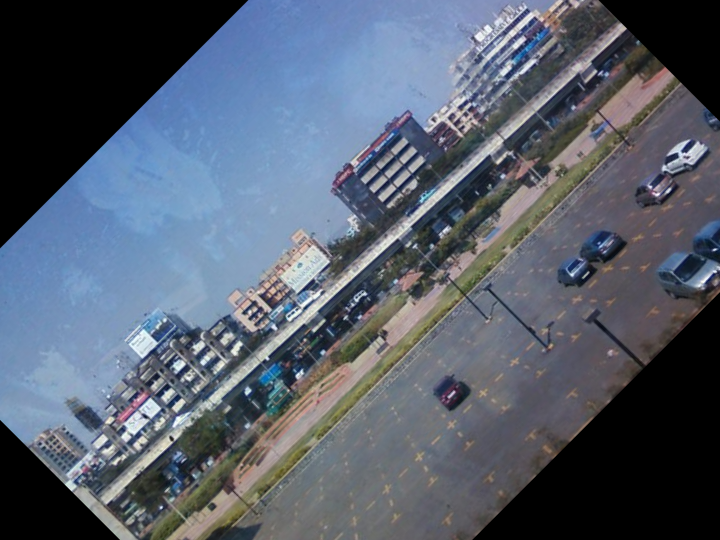

In [ ]:
# Image Rotations

def rotate(img, angle, rotPoint=None):
  (height, width) = img.shape[:2]

  if rotPoint is None:
    rotPoint = (width//2, height//2)

  rotMat = cv.getRotationMatrix2D(rotPoint, angle, 1.0)
  dimensions = (width, height)

  return cv.warpAffine(img, rotMat, dimensions)

rotated = rotate(img, 45)
cv2_imshow(rotated)

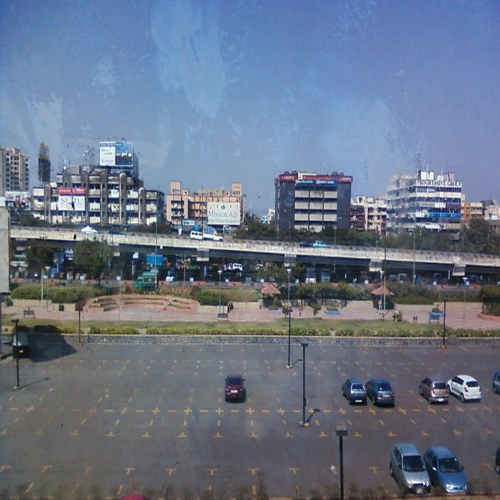

In [ ]:
# Resizing Image

resized = cv.resize(img, (500,500), interpolation=cv.INTER_CUBIC)
cv2_imshow(resized)

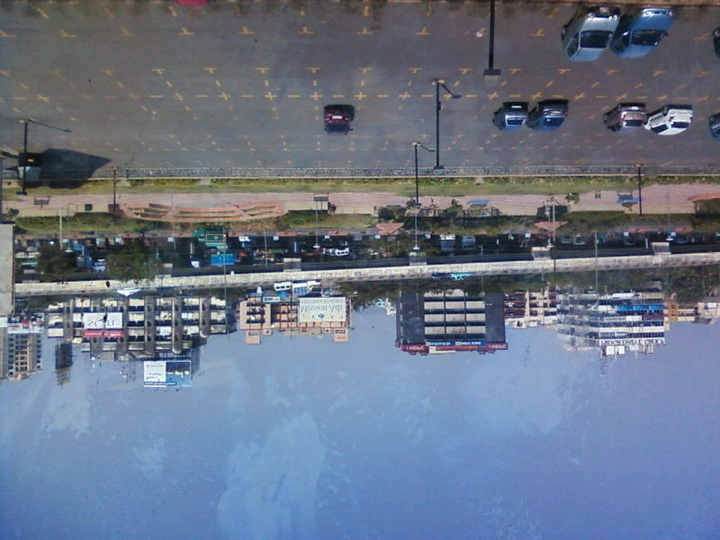

In [ ]:
# Image Flipping

flip = cv.flip(img, 0) #0 stands for flipping vertically
cv2_imshow(flip)

PART-6: EDGE DETECTION WITH GRADIENT FILTERS

Used mainly in shape analysis and object detection

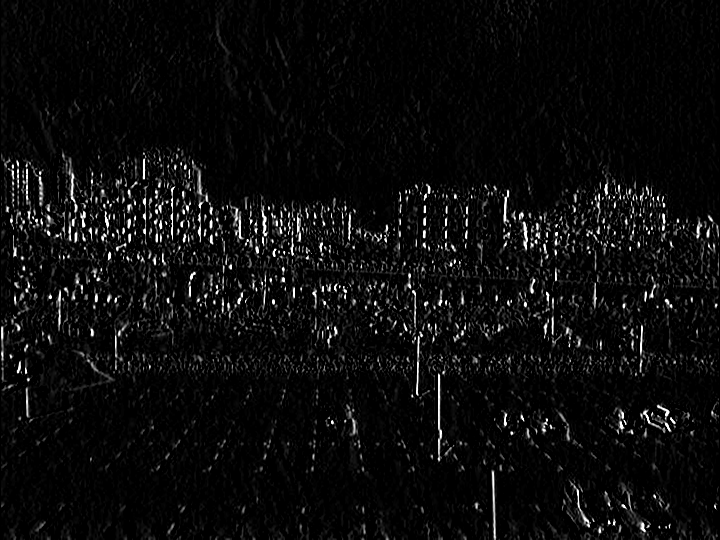

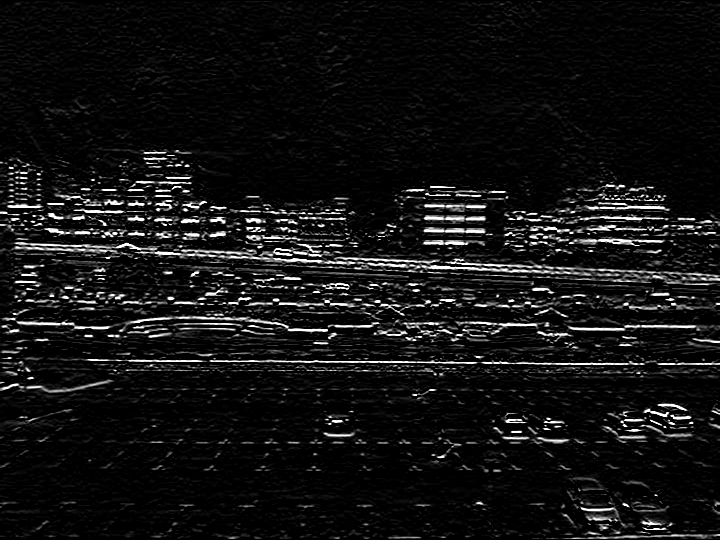

In [ ]:
#Sobel, although a filter, is used for edge detection

sobelx = cv.Sobel(gray, ddepth=cv.CV_64F, dx=1, dy=0) 
sobely = cv.Sobel(gray, ddepth=cv.CV_64F, dx=0, dy=1) 

sobelxy = cv.bitwise_or(sobelx, sobely)

cv2_imshow(sobelx)
cv2_imshow(sobely)

Above, dx and dy stand for derivatives of x and y. The changing of intensity of the pixels, is known as the "function" or f(x) and dx is the variable that represents the rate of change of intensity of the pixels.

What does 'differentiated' here mean?
Differentiation is used to denote a small a very small change in a given function with respect to one of its variables. Here the variable is x

https://www.cuemath.com/calculus/derivative-of-x/

The same goes for variable y in the second line.

sobelx and sobely are formulas for finding vertical and horizontal edges in the image respectively **and are also called** **image gradients.**

Imagine, that a source of light is flashing from the left side of an image. The way areas on the image, exposed towards the left will shine in the light, while others will be in the dark, is how the x-gradient of the image will look like.

The same will look for the y-gradient of the image except that the source of light is flashing from below the image.

The combined effect of the x-gradient(result of sobel-x) and the y-gradient(result of sobel-y) is called the **gradient magnitude** and is mathematically denoted by

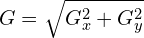

The gradient orientation is used to determine in which direction the change in intensity is pointing and mathematically denoted as 

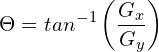

To know about Sobel Edge detection in detail refer here

https://pyimagesearch.com/2021/05/12/image-gradients-with-opencv-sobel-and-scharr/

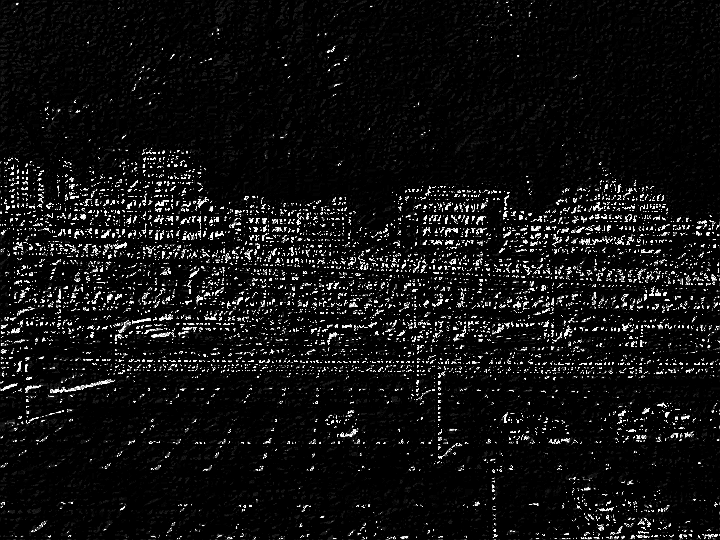

In [ ]:
cv2_imshow(sobelxy)

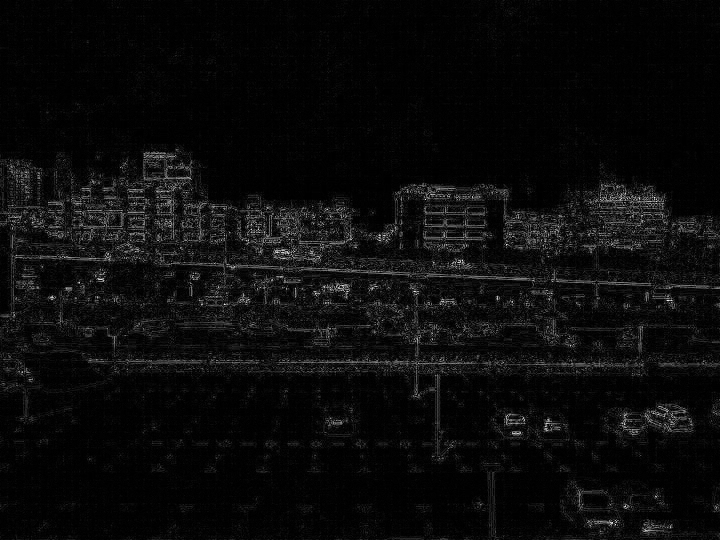

In [ ]:
#Laplacian, although a filter, is used for edge detection

lap = cv.Laplacian(gray, cv.CV_64F)
lap = np.uint8(np.absolute(lap))
cv2_imshow(lap)

Refer here to understand this part: https://aishack.in/tutorials/sobel-laplacian-edge-detectors/

https://cse442-17f.github.io/Sobel-Laplacian-and-Canny-Edge-Detection-Algorithms/

Sobel is suitable when we just want to find obvious edges in an image. When we want to find smaller edges, such as minor colour change in an image, we prefer Laplacian. Thus Laplacian is used for more detailed edge finding, that is finding even minor edges in the image.

What are cv.CV_64F and cv.CV_32F?

They are "Mat" or Matrix, an n-dimensional array that can be used to store various type of data, such as RGB, HSV or grayscale images, vectors with real or complex values, other matrices etc.

A Mat contains the following information: width, height, type, channels, data, flags, datastart, dataend and so on.

CV_ - this is just a prefix

64 - number of bits per base matrix element (e.g. pixel value in grayscale image or single color element in BGR image)

F - type of the base element. In this case it's F for float, but can also be S (signed) or U (unsigned)

Cx - number of channels in an image

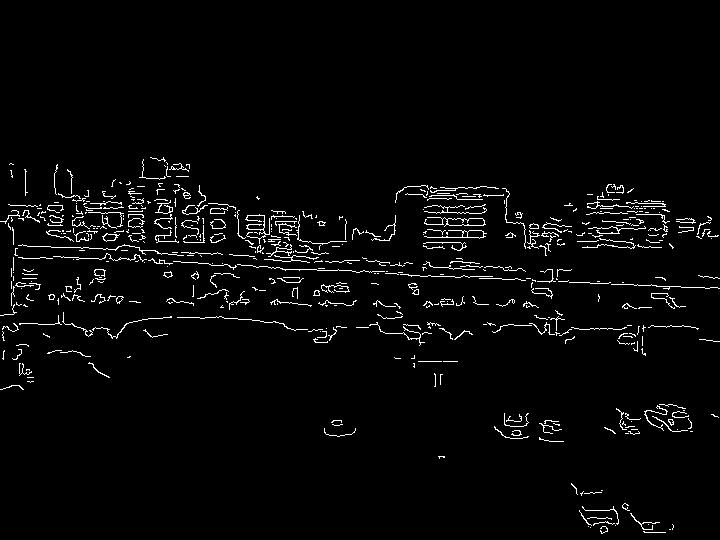

In [ ]:
#Finding Edge Cascade

canny = cv.Canny(blur, 125,175)
cv2_imshow(canny)

#To Canny an image is to highlight the edges of all surfaces inside the image
#The second and third arguments are thresholding values.


The process of creating an edge by the Canny method consists of the following stages:

1. Smoothing the image with a Gaussian blur.
2. Calculating intensity gradient of the image: which includes calculating the **gradient of magnitude** and **gradient direction**.

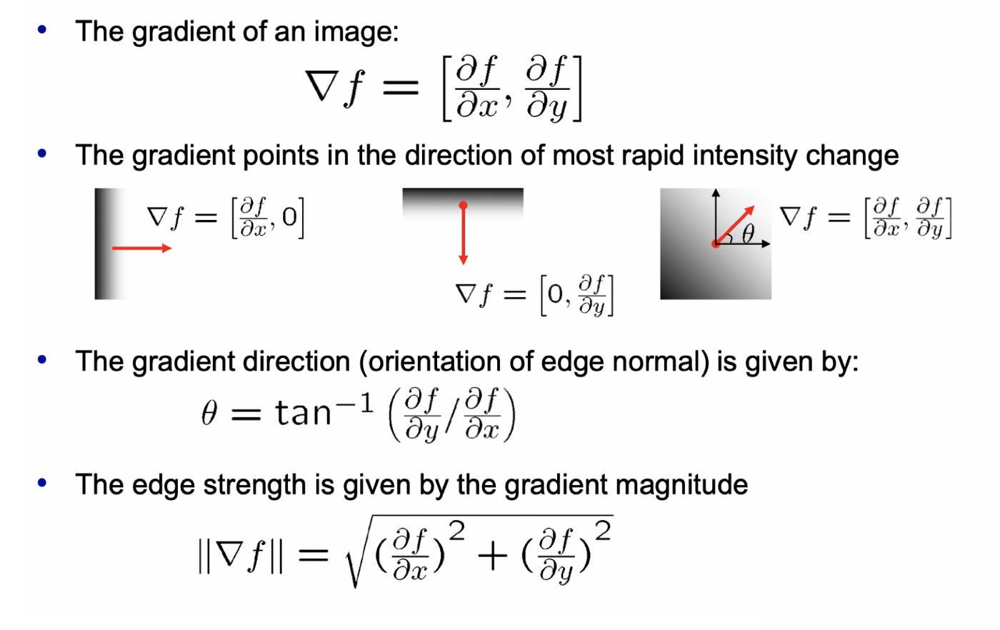


3. Non-maximum Supression

4. Hysteresis Thresholding

Sources and refer here:

https://learnopencv.com/edge-detection-using-opencv/#canny-edge

https://medium.com/jun94-devpblog/cv-5-canny-edge-detector-with-image-gradients-a42f07dc69c


PART-7: THRESHOLDING

7a. Binary Thresholding

    if pixelvalue > thresh:
      newpixelval = maxValue
    else:
      newpixelval = 0


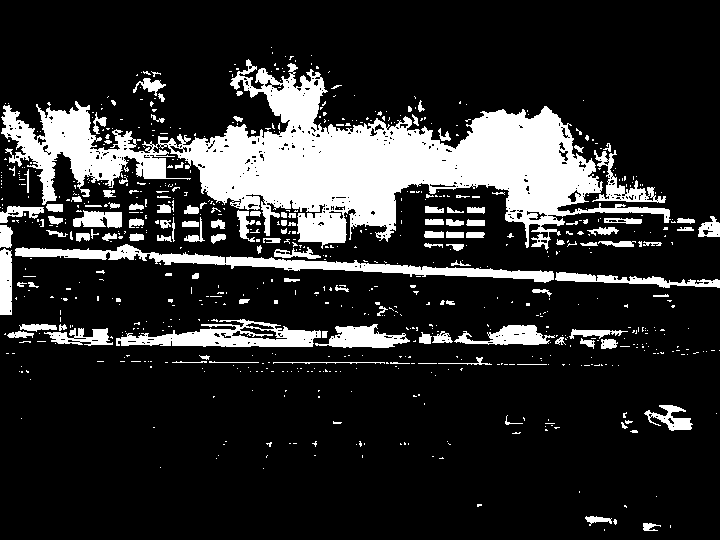

In [ ]:
ret, thresh_binary = cv.threshold(gray, 150, 255, cv.THRESH_BINARY)
cv2_imshow(thresh_binary)

# The second argument is the threshold value which is used to classify the pixel values. 
# The third argument is the maximum value which is assigned to pixel values exceeding the threshold.

7b. Inverse Binary Thresholding

    if pixelvalue > thresh:
      newpixelval = 0
    else:
      newpixelval = maxvalue

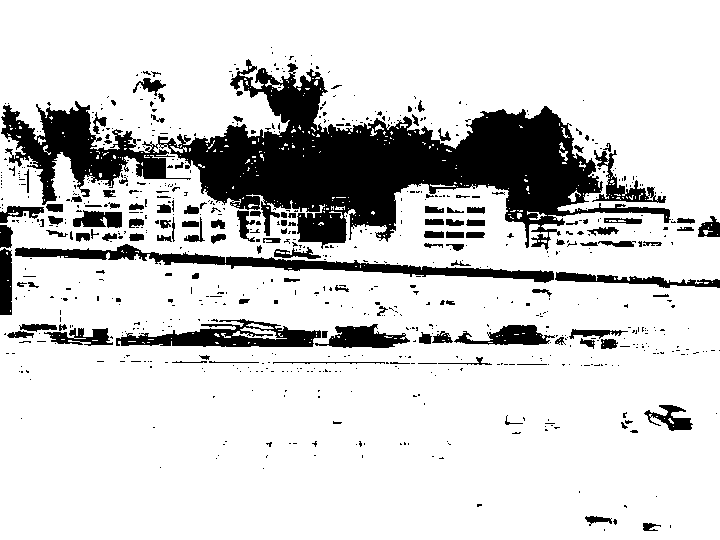

In [ ]:
ret, thresh_binaryinv = cv.threshold(gray, 150, 255, cv.THRESH_BINARY_INV)
cv2_imshow(thresh_binaryinv)

7c. Truncate Thresholding

    if pixelvalue > thresh:
      newpixelval = thresh
    else:
      newpixelval = pixelvalue

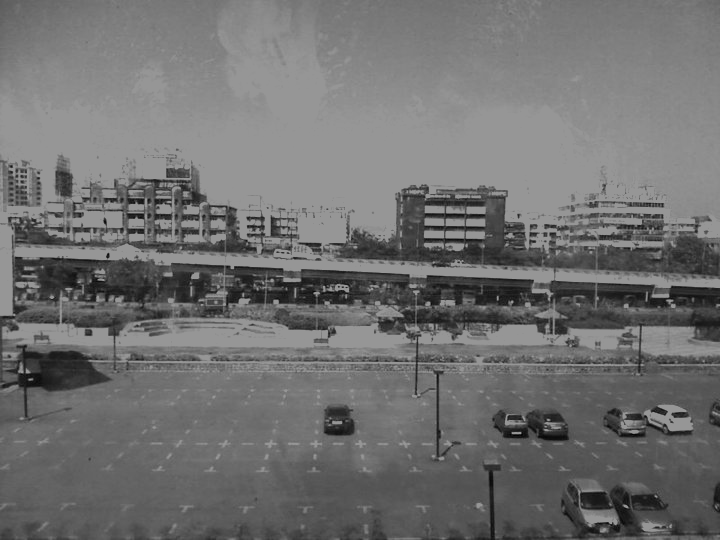

In [ ]:
ret, thresh_trunc = cv.threshold(gray, 150, 255, cv.THRESH_TRUNC)
cv2_imshow(thresh_trunc)

7d. Threshold to Zero

    if pixelvalue > thresh:
      newpixelval = pixelvalue
    else:
      newpixelval = 0

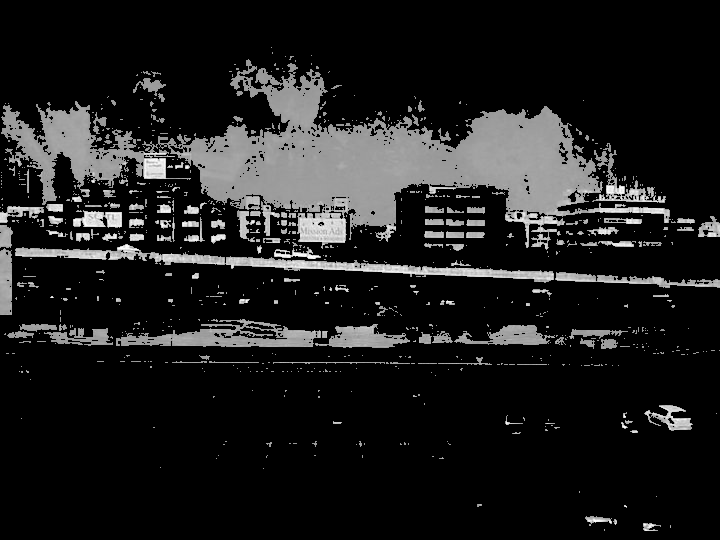

In [ ]:
ret, thresh_tozero = cv.threshold(gray, 150, 255, cv.THRESH_TOZERO)
cv2_imshow(thresh_tozero)

7e. Inverse Threshold to Zero

    if pixelvalue > thresh:
      newpixelval = 0
    else:
      newpixelval = pixelvalue

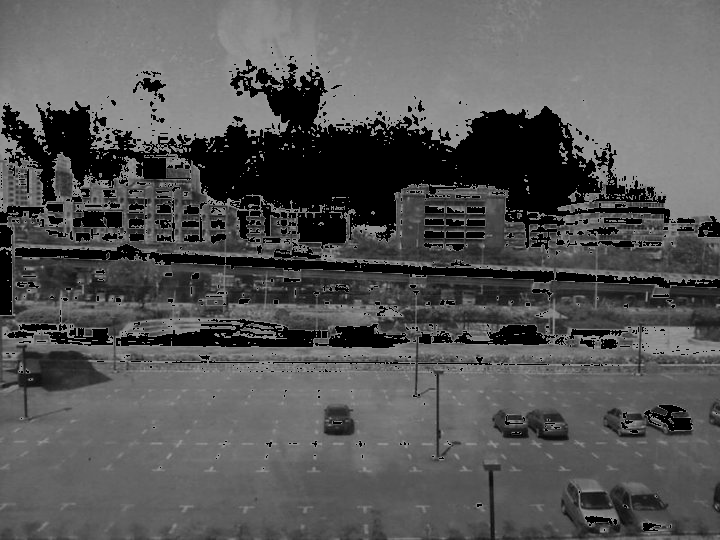

In [ ]:
thresh, thresh_tozero_inv = cv.threshold(gray, 150, 255, cv.THRESH_TOZERO_INV)
cv2_imshow(thresh_tozero_inv)

PART-8: FEATURE/CONTOUR DETECTION

To know more about contour detection before you begin, refer here https://learnopencv.com/contour-detection-using-opencv-python-c/

https://medium.com/analytics-vidhya/opencv-findcontours-detailed-guide-692ee19eeb18

In [ ]:
# We start from the point where we created a canny image

contours, hierarchies = cv.findContours(canny, mode=cv.RETR_LIST, method=cv.CHAIN_APPROX_NONE)
#print(f"int({contours}) have been found")


int([array([[[643, 531]],

       [[644, 532]],

       [[645, 532]],

       [[646, 532]],

       [[647, 532]],

       [[648, 532]],

       [[649, 532]],

       [[650, 532]],

       [[651, 532]],

       [[652, 532]],

       [[653, 532]],

       [[654, 532]],

       [[655, 532]],

       [[656, 532]],

       [[657, 532]],

       [[658, 532]],

       [[659, 532]],

       [[660, 532]],

       [[661, 532]],

       [[662, 532]],

       [[663, 532]],

       [[664, 532]],

       [[665, 532]],

       [[664, 532]],

       [[663, 532]],

       [[662, 532]],

       [[661, 532]],

       [[660, 532]],

       [[659, 532]],

       [[658, 532]],

       [[657, 532]],

       [[656, 532]],

       [[655, 532]],

       [[654, 532]],

       [[653, 532]],

       [[652, 532]],

       [[651, 532]],

       [[650, 532]],

       [[649, 532]],

       [[648, 532]],

       [[647, 532]],

       [[646, 532]],

       [[645, 532]],

       [[644, 531]]], dtype=int32), array([[[669,

The contours variable is a list of all the co-ordinates of the image. The hierarchies variable is the heirarchical representation of the contours on the image.

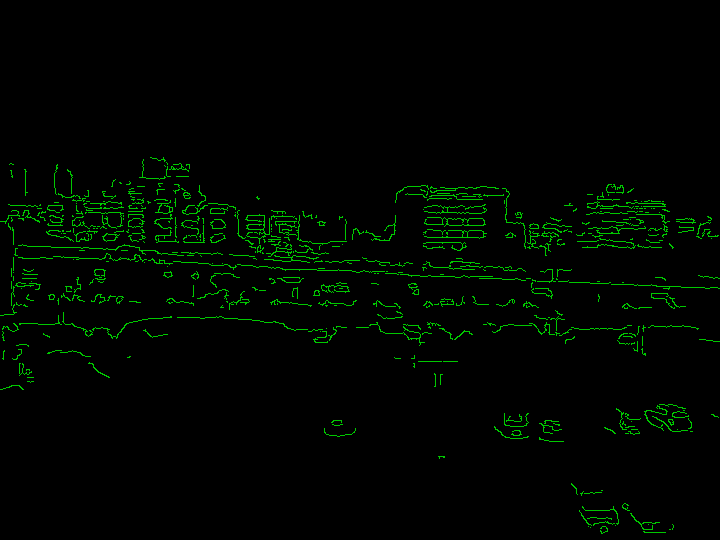

In [ ]:
blank = np.zeros(img.shape, dtype='uint8') 
cv.drawContours(blank, contours, -1, (0,200,0), 1)
cv2_imshow(blank)

In [ ]:
# Here we will start with converting the binary threshold

binary_based_contours, hierarchies = cv.findContours(thresh_binary, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_SIMPLE)
#print(f"int({contours}) have been found")


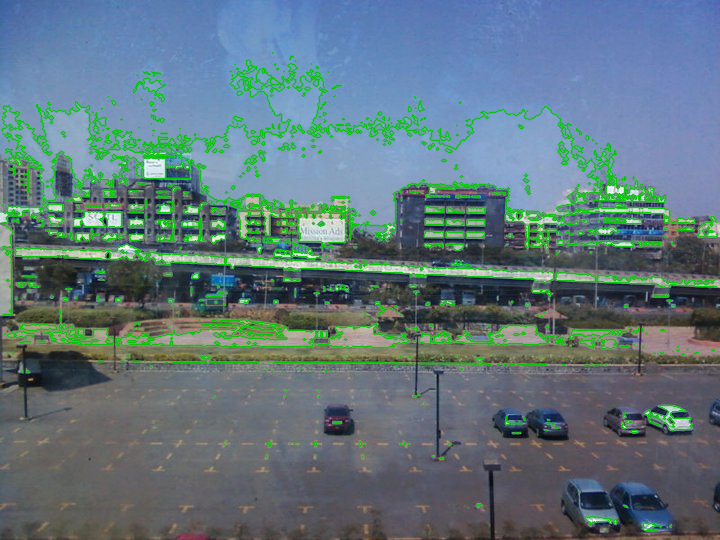

In [ ]:
image = img.copy()
cv.drawContours(image, binary_based_contours, -1, (0,200,0), 1, lineType=cv.LINE_AA)
cv2_imshow(image)

modes

RETR_EXTERNAL returns only external contours

RETR_TREE returns only heirarchical contours and establishes heirarchy

RETR_LIST returns hierarchical contours without any hierarchies

methods

CHAIN_APPROX_SIMPLE


CHAIN_APPROX_NONE

Theory about how the various above modes work is inside the link above. Read it.

PART-9: IMAGE ENHANCEMENT

In [ ]:
# Addition or Brightness

greenhill = cv.imread('/content/drive/MyDrive/Colab Notebooks/IMG_20210829_074650934_HDR.jpg')
greenhillrgb = cv.cvtColor(greenhill, cv.COLOR_BGR2RGB)

matrix = np.ones(greenhillrgb.shape, dtype="uint8")*50 #here 50 is the maximum pixel intensity

greenhill_brighter = cv.add(greenhillrgb, matrix)
greenhill_darker = cv.subtract(greenhillrgb, matrix)

#Plotting the results
plt.figure(figsize=[18,5])  #figsize = width and height in inches
plt.subplot(1,3,1); plt.imshow(greenhill_darker); plt.title("Darker"); #subplot(1,3,1) has 1 row, 3 columns, and is the first plot
plt.subplot(1,3,2); plt.imshow(greenhillrgb); plt.title("Normal");
plt.subplot(1,3,3); plt.imshow(greenhill_brighter); plt.title("Brighter");

error: ignored

Pixel intensity is expressed as one int value on a matrix of the same size as the image and thus the pixel intensity adds into the given image with cv.sum() thus making the image brighter (more intensity = more towards whiteness) and removes intensity with the cv.subtract() thus making the image darker.


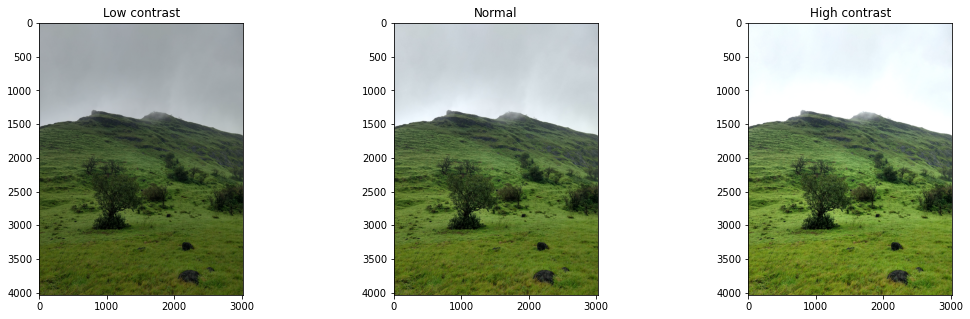

In [ ]:
# Multiplication or Contrast

matrix1 = np.ones(greenhillrgb.shape)*0.8
matrix2 = np.ones(greenhillrgb.shape)*1.2

contrast_dense = np.uint8(cv.multiply(np.float64(greenhillrgb), matrix1))
#contrast_light = np.uint8(cv.multiply(np.float64(greenhillrgb), matrix2))
contrast_light = np.uint8(np.clip(cv.multiply(np.float64(greenhillrgb), matrix2), 0, 255))

#np.clip clips the values in the image/array that are causing overflow

#Plotting the results
plt.figure(figsize=[18,5])  #figsize = width and height in inches
plt.subplot(1,3,1); plt.imshow(contrast_dense); plt.title("Low contrast"); #subplot(1,3,1) has 1 row, 3 columns, and is the first plot
plt.subplot(1,3,2); plt.imshow(greenhillrgb); plt.title("Normal");
plt.subplot(1,3,3); plt.imshow(contrast_light); plt.title("High contrast");

contrast_light = np.uint8(cv.multiply(np.float64(greenhillrgb), matrix2))

The original image has pixels with value near 255. So when we multiply it with 1.2, the resultant pixel value falls to near zero and we get dark patches.

contrast_light = np.uint8(np.clip(cv.multiply(np.float64(greenhillrgb), matrix2), 0, 255))

Above, the function np.clip() clips the overflowing values from an array

PART 10: BITWISE OPERATORS

https://www.pyimagesearch.com/2021/01/19/opencv-bitwise-and-or-xor-and-not/

PART11: MASKING

PART 12: OBJECT TRACKING

In [ ]:
video_capture = cv.VideoCapture('/content/drive/MyDrive/Indian Highway Aerial View No Copyright Drone Footage NCFI.mp4')

while True:
  _, frame = video_capture.read()

  cv2_imshow(frame)
  key = cv.waitKey(1)

  if key == 27:
    break

video_capture.release()


In [ ]:
!nvidia-smi

Tue Dec 21 09:28:50 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8    30W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#clone darknet repository

import os
os.environ['PATH'] += ':/usr/local/cuda/bin'
!rm -fr darknet
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 15379, done.
remote: Total 15379 (delta 0), reused 0 (delta 0), pack-reused 15379
Receiving objects: 100% (15379/15379), 14.01 MiB | 18.39 MiB/s, done.
Resolving deltas: 100% (10341/10341), done.


In [ ]:
%cd /content/darknet

/content/darknet


In [ ]:
!pwd

/content/darknet


In [ ]:
#go to the darknet folder, edit and remake Makefiles of GPU and OPENCV

!sed -i 's/GPU=0/GPU=1/g' Makefile
!sed -i 's/OPENCV=0/OPENCV=1/g' Makefile

!make

mkdir -p ./obj/
mkdir -p backup
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:946:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
                 float rgb[3];
                       ^~~
./src/image_opencv.cpp: In function ‘void draw_train_loss(char*, void**, int, float, float, int, int, float, int, char*, float, int, int, double)’:
./src/image_opencv.cpp:1147:13: warning: this ‘if’ clause does not guard... [-Wmisleading-indentation]
             if (iteration_old == 0)
             ^~
./src/image_opencv.cpp:1150:10: note: ...this statement

In [ ]:
# get yolov3 weights

!wget https://pjreddie.com/media/files/yolov3.weights
!chmod a+x ./darknet

--2021-12-21 09:43:02--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  62.4MB/s    in 4.0s    

2021-12-21 09:43:06 (58.7 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [ ]:
!pwd

/content/darknet


In [ ]:
!apt install ffmpeg libopencv-dev libgtk-3-dev python-numpy python3-numpy libdc1394-22 libdc1394-22-dev libjpeg-dev libtiff5-dev libavcodec-dev libavformat-dev libswscale-dev libxine2-dev libgstreamer1.0-dev libgstreamer-plugins-base1.0-dev libv4l-dev libtbb-dev qtbase5-dev libfaac-dev libmp3lame-dev libopencore-amrnb-dev libopencore-amrwb-dev libtheora-dev libvorbis-dev libxvidcore-dev x264 v4l-utils unzip

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libjpeg-dev is already the newest version (8c-2ubuntu8).
libjpeg-dev set to manually installed.
libvorbis-dev is already the newest version (1.3.5-4.2).
libvorbis-dev set to manually installed.
python-numpy is already the newest version (1:1.13.3-2ubuntu1).
python-numpy set to manually installed.
libdc1394-22 is already the newest version (2.2.5-1).
libdc1394-22 set to manually installed.
libdc1394-22-dev is already the newest version (2.2.5-1).
libdc1394-22-dev set to manually installed.
libtbb-dev is already the newest version (2017~U7-8).
libtbb-dev set to manually installed.
libtiff5-dev is already the newest version (4.0.9-5ubuntu0.4).
libtiff5-dev set to manually installed.
qtbase5-dev is already the newest version (5.9.5+dfsg-0ubuntu2.6).
qtbase5-dev set to manually installed.
unzip is already the newest version (6.0-21ubuntu1.1).
ffmpeg is already the newest version (7:3.4.8-0ubuntu0